https://stackoverflow.com/questions/65069624/networkx-cluster-nodes-in-a-circular-formation-based-on-node-color

https://stackoverflow.com/questions/61425817/force-nodes-positions-on-concentric-circles-in-graphviz-graph

Requires to run build adjacency matrix and calculate centrality.ipynb before run this.

Each plot may take 5 min to generate.

In [20]:
import numpy as np
import networkx as nx
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd
from datetime import datetime
import time
from tqdm.notebook import tqdm,trange
import re
import os
import warnings
import json
import logging
import scipy
warnings.filterwarnings("ignore") 
logging.getLogger('matplotlib.font_manager').disabled = True

In [14]:
def nameToIndexDict(l_unique_names):
    '''
    create name to index dictionary and index to name dictionary for later use
    
    l_unique_names: a list of sorted unique names
    return: name2id
    return: id2name
    '''
    name2id = {}
    for idx,name in enumerate(l_unique_names):    # unique_names
        name2id[name] = idx

    id2name = {}
    for idx, name in enumerate(l_unique_names):
        id2name[idx] = name

    return name2id, id2name

# Load 3 people lists and unique people

In [42]:
with open('government_idx_list.txt') as f:
    government_idx_list = list(map(int,f.read().splitlines()))

In [8]:
with open('commissioner_dict.json', 'r') as f:
    commissioner_dict = json.load(f)
with open('cra_dict.json', 'r') as f:
    cra_dict = json.load(f)
cra_list = []
for v in cra_dict.values():
    cra_list += v
commissioner_list = []
for v in commissioner_dict.values():
    commissioner_list += v
target_people_list = cra_list + commissioner_list

In [9]:
len(target_people_list)

129

In [10]:
with open('unique_people.txt', encoding = 'utf-8') as f:
    unique_people = f.read().splitlines()

In [15]:
num_people = len(unique_people)
name2id, id2name = nameToIndexDict(unique_people)

In [16]:
cra_idx_list = []
for i,people in enumerate(unique_people):
    if people in cra_list:
        cra_idx_list.append(i)
len(cra_idx_list)

54

In [17]:
commissioner_idx_list = []
for i,people in enumerate(unique_people):
    if people in commissioner_list:
        commissioner_idx_list.append(i)
len(commissioner_idx_list)

74

In [18]:
total_idx_list = cra_idx_list + commissioner_idx_list

In [23]:
infile = 'sparse_idxes_stage.npz'
sparse_matrix = scipy.sparse.load_npz(infile)
idxes = np.asarray(sparse_matrix.todense())

In [54]:
num_emails = idxes.sum(axis = 1)

In [46]:
infile = 'label_colors_stage.json'
with open(infile) as f:
    label_colors_stage = json.load(f)
stage_labels = list(label_colors_stage.keys())

In [30]:
invalid_nodes = []
invalid_node_idxs = []
for i,people in enumerate(unique_people):
    if 'invalid' in people:
        invalid_nodes.append(people)
        invalid_node_idxs.append(i)
invalid_nodes, invalid_node_idxs

(['invalid', 'invalid_nan'], [10111, 10112])

In [63]:
# these are necessary if you like to merge nodes
# cra
idx = 0
for k in cra_dict:
    for i in range(len(cra_dict[k])):
        cra_dict[k][i] = idx
        idx += 1
# commissioner
idx = 0
for k in commissioner_dict:
    for i in range(len(commissioner_dict[k])):
        commissioner_dict[k][i] = idx
        idx += 1
nodes_to_add = list(cra_dict.keys()) + list(commissioner_dict.keys())


num_people = len(unique_people)
idx_mapping = {}
cra_idx_list_new = []
for person,idx_list in cra_dict.items():
    global_indices = []
    for idx in idx_list:
        global_idx = unique_people.index(cra_list[idx])
        global_indices.append(global_idx)
    idx_mapping[num_people] = global_indices
    num_people +=1
    cra_idx_list_new.append(num_people) 
commissioner_idx_list_new = []
for person,idx_list in commissioner_dict.items():
    global_indices = []
    for idx in idx_list:
        global_idx = unique_people.index(commissioner_list[idx])
        global_indices.append(global_idx)
    idx_mapping[num_people] = global_indices
    num_people +=1 
    commissioner_idx_list_new.append(num_people) 
    

total_idx_list_new = cra_idx_list_new + commissioner_idx_list_new
total_idx_list_new = np.array(total_idx_list_new) - len(total_idx_list) - 1
total_idx_list_new = total_idx_list_new.tolist()
cra_idx_list_new = total_idx_list_new[:len(cra_idx_list_new)]
commissioner_idx_list_new = total_idx_list_new[len(cra_idx_list_new):]

In [79]:
def merge_nodes(email_adj_mat):
    # merge nodes by combining columns in adjmat
    unique_people_combined = unique_people.copy()
    size1 = email_adj_mat.shape[0]
    size2 = size1 + len(idx_mapping)
    idx_to_remove = []
    for _,v in idx_mapping.items():
        new_r = np.zeros(size1)
        for r_idx in v:
            new_r += email_adj_mat[r_idx,:]
            idx_to_remove.append(r_idx)
        email_adj_mat = np.vstack((email_adj_mat,new_r))

    for _,v in idx_mapping.items():
        new_c = np.zeros(size2)
        for c_idx in v:
            new_c += email_adj_mat[:,c_idx]
        email_adj_mat = np.hstack((email_adj_mat,new_c.reshape(-1,1)))
    
    email_adj_mat = np.delete(email_adj_mat, idx_to_remove, axis=0)
    email_adj_mat = np.delete(email_adj_mat, idx_to_remove, axis=1)
    
    unique_people_combined = np.array(unique_people_combined)
    unique_people_combined = np.delete(unique_people_combined, idx_to_remove, axis=0)
    unique_people_combined = unique_people_combined.tolist()
    unique_people_combined += nodes_to_add
    
    # update goverment list
    government_idx_list_new = []
    for i,people in enumerate(unique_people_combined):
        for j,people2 in enumerate(gorvenment_people_list):
            first = people2[0]
            last = people2[1]
            email = people2[2]
            if people == email or people == first+last \
                or 'talgov.com' in people or 'leoncountyfl.gov' in people or 'tallahassee.com' in people:
                if i not in cra_idx_list and i not in commissioner_idx_list :
                    government_idx_list_new.append(i)
                    break
    
    # making copies are necessary. Otherwise, the second plot will swap back to the original position again
    government_idx_list_new2 = government_idx_list_new.copy()
    total_idx_list_new2 = total_idx_list_new.copy()
    new_idx = np.linspace(0,len(unique_people_combined),len(total_idx_list_new)+1, dtype = int)[:-1]
    for i in range(len(total_idx_list_new2)):
        p1_idx = total_idx_list_new2[i]
        p1 = unique_people_combined[p1_idx]
        p2_idx = new_idx[i]
        p2 = unique_people_combined[p2_idx]
        unique_people_combined[p1_idx], unique_people_combined[p2_idx] = p2, p1
        email_adj_mat[:,[p1_idx, p2_idx]] = email_adj_mat[:,[p2_idx, p1_idx]]
        email_adj_mat[[p1_idx, p2_idx],:] = email_adj_mat[[p2_idx, p1_idx],:]
        
        if p2_idx in government_idx_list_new2:
            total_idx_list_new2[i], government_idx_list_new2[government_idx_list_new.index(p2_idx)] = p2_idx, p1_idx
        else:
            total_idx_list_new2[i] = p2_idx


    cra_idx_list_new2 = total_idx_list_new2[:len(cra_idx_list_new)]
    commissioner_idx_list_new2 = total_idx_list_new2[len(cra_idx_list_new):]
    name2id_new2, id2name_new2 = nameToIndexDict(unique_people_combined)
    return unique_people_combined, email_adj_mat, cra_idx_list_new2, commissioner_idx_list_new2, total_idx_list_new2, government_idx_list_new, name2id_new2, id2name_new2


In [82]:
def concentric_plot(adj_folder, invalid_node_idxs, name2id, num_emails, merge, edge_scaler = 20, node_size_by = 'both', node_scaler = 100, label_top = 10, label_inner = False, title = 'EMAIL NETWORK'):
    
    radii = [6,10,13]  # set the diameter for the three circles
    
    fig = plt.figure(figsize=(12,50))
    fig.suptitle(title,fontsize = 24, y=1.04)
    for k in trange(4): # only for the 4 stages
        # load and process adjmat
        infile = os.path.join(adj_folder, 'adjmat_stage_'+str(k)+'.npz') 
        sparse_matrix = scipy.sparse.load_npz(infile)
        email_adj_mat = np.asarray(sparse_matrix.todense())
        num_email = num_emails[k]
        if invalid_node_idxs is not None:
            for invalid_node_idx in invalid_node_idxs:
                email_adj_mat[invalid_node_idx,:] = 0.
                email_adj_mat[:,invalid_node_idx] = 0.

        email_adj_mat = email_adj_mat + email_adj_mat.T
        email_adj_mat = np.triu(email_adj_mat, 1)
        email_adj_mat = email_adj_mat/email_adj_mat.max() # scale the adjmat by the maximum number
        
        # merge nodes that belong to the same person
        if merge:
            unique_people, email_adj_mat, cra_idx_list, commissioner_idx_list, total_idx_list, government_idx_list, name2id, id2name = merge_nodes(email_adj_mat)
        
        # preparing for plot
        networks = [1,2,3]
        networks_list = []
        for i in range(len(unique_people)):
            if i in total_idx_list:
                networks_list.append(1)
            elif i in government_idx_list:
                networks_list.append(2)
            else:
                networks_list.append(3)
        # map color
        node_network_map = dict(zip(unique_people, networks_list))
        colors = ['red', 'orange', 'green']
        color_map = dict(zip(networks, colors))
        
        # build graph
        G = nx.Graph()
        G = nx.from_numpy_array(email_adj_mat, create_using=nx.Graph) # arrows look bad on thick edges. Use undirected instead.
        G = nx.relabel_nodes(G, id2name)   # relabel the node with corresponding names
        
        # calculate node position
        pos = nx.circular_layout(G) # calculate position
        nodes_by_color = {val: [node for node in G if color_map[node_network_map[node]] == val] for val in colors}
        for ea in pos.keys():
            new_r = 1
            if ea in nodes_by_color['red']:
                new_r = radii[0]
            elif ea in nodes_by_color['orange']:
                new_r = radii[1]
            elif ea in nodes_by_color['green']:
                new_r = radii[2]
            else:
                pass
            pos[ea] *= new_r   # reposition nodes as concentric circles
        
        # scale edge widths
        edge_width = []
        edges_list = G.edges()
        for s,t in edges_list:
            edge_width.append(email_adj_mat[name2id[s],name2id[t]])
        edge_width = np.array(edge_width)
        edge_width = edge_scaler*edge_width
        
        # scale nodes
        assert node_size_by in ['both', 'send', 'receive'], 'not implemented'
        if node_size_by == 'both':
            node_size = email_adj_mat.sum(axis=0) + email_adj_mat.sum(axis=1)
        elif node_size_by == 'send':
            node_size = email_adj_mat.sum(axis=0)
        else:
            node_size = email_adj_mat.sum(axis=1)
        node_size = node_scaler*node_size
        
        # select top most active people and label their names
        labeling_idx = node_size.argsort()[-label_top:][::-1]
        labels = {}
        for i in labeling_idx:
            node = id2name[i]
            labels[node] = node
        if label_inner:
            for node,group in node_network_map.items():
                if group == 1:
                    labels[node] = node

        # seperate nodes by groups/color
        node_sizes = {}
        node_sizes['red'] = node_size[total_idx_list]
        node_sizes['orange'] = node_size[government_idx_list]
        node_sizes['green'] = node_size[[item for item in np.arange(len(unique_people)) if item not in (total_idx_list+government_idx_list)]]

        # plot
        plt.subplot(4,1,k+1)    
        legend_labels = {'red': 'CRA/comissioner','orange': 'government people','green': 'others' }
        for color, node_names in nodes_by_color.items():
            local_node_size = node_sizes[color]
            nx.draw_networkx_nodes(G, pos=pos, node_size=local_node_size, edgecolors='darkblue', nodelist=node_names, node_color=color, label=legend_labels[color])
        
        nx.draw_networkx_edges(G, pos=pos, width=edge_width, edge_color = 'grey')
        nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=20, font_color='black')
        plt.title('stage'+str(k+1)+': '+stage_labels[k] + '\n#email: '+str(num_email),fontsize = 28)
        plt.legend(fontsize = 24, loc=2)
        plt.axis('off')

        # free memory
        email_adj_mat = None

    plt.tight_layout()
    plt.show()

# whole network without merge

  0%|          | 0/4 [00:00<?, ?it/s]

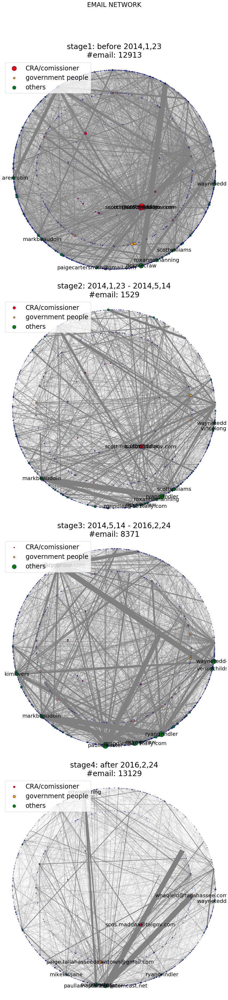

In [59]:
concentric_plot(adj_folder, invalid_node_idxs, name2id, num_emails, merge=False, edge_scaler = 20, node_size_by='send', node_scaler = 100, label_top = 10, label_inner = False, title = 'EMAIL NETWORK')

# with merge
## node size by send

  0%|          | 0/4 [00:00<?, ?it/s]

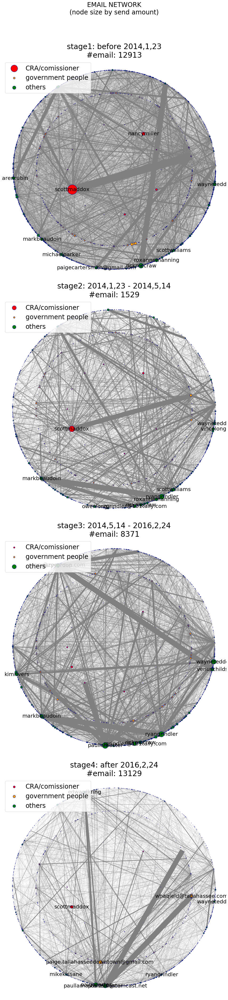

In [83]:
concentric_plot(adj_folder, invalid_node_idxs, name2id, num_emails, merge=True, edge_scaler = 20, node_size_by='send',  node_scaler = 100, label_top = 10, label_inner = False, title = 'EMAIL NETWORK\n(node size by send amount)')

## node size by receive

  0%|          | 0/4 [00:00<?, ?it/s]

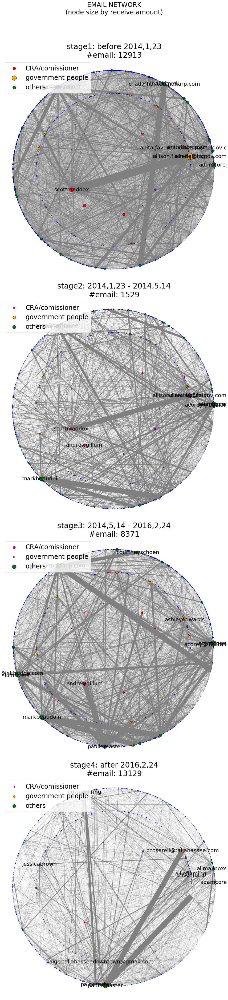

In [84]:
concentric_plot(adj_folder, invalid_node_idxs, name2id, num_emails, merge=True, edge_scaler = 20, node_size_by='receive',  node_scaler = 100, label_top = 10, label_inner = False, title = 'EMAIL NETWORK\n(node size by receive amount)')

## node size by send and receive

  0%|          | 0/4 [00:00<?, ?it/s]

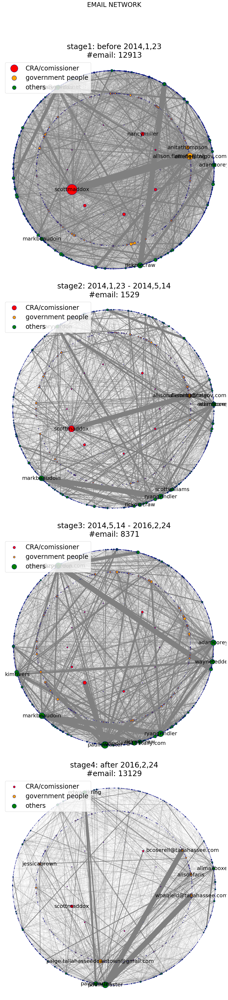

In [85]:
concentric_plot(adj_folder, invalid_node_idxs, name2id, num_emails, merge=True, edge_scaler = 20, node_size_by='both',  node_scaler = 100, label_top = 10, label_inner = False)